# **Solución del Parcial 2**

**Asignatura:** Aprendizaje de máquina y Análisis de datos

**Integrantes:**

1.   Daniel Vasquez / danielvasquez2004@javerianacali.edu.co
2.   Miguel Nivia / miguelnivia19@javerianacali.edu.co
3.   Willian Chapid / will1an@javerianacali.edu.co

**Fecha máxima:** 07/04/2024




# Librerias

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.graph_objs as go
import plotly.io as pio
import matplotlib.pyplot as plt
from ipywidgets import interactive
from matplotlib.colors import ListedColormap
from mpl_toolkits.mplot3d import Axes3D
from google.colab import files
from sklearn.feature_selection import VarianceThreshold, f_classif, mutual_info_classif
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Perceptron, SGDClassifier, LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier

# Datos y EDA

In [ ]:
uploaded = files.upload()
data = pd.read_csv("data_mnist_parcial2.csv")

Saving data_mnist_parcial2.csv to data_mnist_parcial2.csv


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Clase         60000 non-null  float64
 1   Muestra       60000 non-null  float64
 2   prom_ai       60000 non-null  float64
 3   desv_est_ai   60000 non-null  float64
 4   cur_ai        59588 non-null  float64
 5   asime_ai      59588 non-null  float64
 6   prom_ad       60000 non-null  float64
 7   desv_est_ad   60000 non-null  float64
 8   cur_ad        59986 non-null  float64
 9   asime_ad      59986 non-null  float64
 10  prom_abi      60000 non-null  float64
 11  desv_est_abi  60000 non-null  float64
 12  cur_abi       59525 non-null  float64
 13  asime_abi     59525 non-null  float64
 14  prom_abd      60000 non-null  float64
 15  desv_est_abd  60000 non-null  float64
 16  cur_abd       59971 non-null  float64
 17  asime_abd     59971 non-null  float64
dtypes: float64(18)
memory usag

In [ ]:
data.describe()

,Clase,Muestra,prom_ai,desv_est_ai,cur_ai,asime_ai,prom_ad,desv_est_ad,cur_ad,asime_ad,prom_abi,desv_est_abi,cur_abi,asime_abi,prom_abd,desv_est_abd,cur_abd,asime_abd
count,60000.000000,60000.000000,60000.000000,60000.000000,59588.000000,59588.000000,60000.000000,60000.000000,59986.000000,59986.000000,60000.000000,60000.000000,59525.000000,59525.000000,60000.000000,60000.000000,59971.000000,59971.000000
mean,4.453933,3009.144783,25.418560,65.014920,14.968080,3.297568,37.196506,79.579831,3.579656,2.136082,34.209497,75.241181,6.153589,2.436970,36.449123,78.344853,5.077212,2.291629
std,2.889270,1747.313594,13.540388,21.186214,32.976781,2.312580,14.226751,14.574792,6.144030,0.810673,16.390227,19.913442,13.375851,1.321853,15.502819,17.082479,10.618840,1.188631
min,0.000000,1.000000,0.000000,0.000000,-1.671437,0.521130,0.000000,0.000000,-1.846236,0.321827,0.000000,0.000000,-1.917827,0.197706,0.000000,0.000000,-1.940107,0.089550
25%,2.000000,1500.750000,16.561224,55.896911,2.793168,2.123639,27.198980,70.553967,0.882067,1.633423,22.702806,65.077808,0.989898,1.664542,26.188776,69.436809,0.820163,1.613999
50%,4.000000,3000.500000,24.903061,68.337096,5.406048,2.645267,35.525510,80.183398,2.436135,2.034333,33.188776,77.792935,2.894212,2.140398,36.112245,80.675097,2.316337,2.006453
75%,7.000000,4500.250000,33.744898,79.044283,10.326130,3.418093,45.755102,89.709708,4.568424,2.482556,44.770408,89.019628,6.275046,2.793407,46.341837,90.110949,4.889059,2.546356
max,9.000000,6742.000000,93.857143,122.565514,191.005128,13.892629,105.540816,120.415409,191.005128,13.892629,114.051020,122.858378,191.005128,13.892629,120.428571,125.997630,191.005128,13.892629


In [ ]:
print(data)

       Clase  Muestra    prom_ai  desv_est_ai     cur_ai  asime_ai    prom_ad  \
0        0.0      1.0  26.423469    70.324244   5.018320  2.583517  56.290816   
1        0.0      2.0  27.632653    72.884643   4.419385  2.473292  67.295918   
2        0.0      3.0  22.806122    69.034694   6.310091  2.846648  62.602041   
3        0.0      4.0  24.000000    68.428422   5.939083  2.748865  67.795918   
4        0.0      5.0  43.204082    89.498485   1.142878  1.727267  72.229592   
...      ...      ...        ...          ...        ...       ...        ...   
59995    9.0   5945.0  17.362245    57.914226  10.423489  3.451194  26.224490   
59996    9.0   5946.0  19.607143    58.643629   8.304009  3.101074  29.045918   
59997    9.0   5947.0  22.321429    64.271854   6.369751  2.805948  34.729592   
59998    9.0   5948.0  20.836735    62.455730   7.484121  2.988922  36.071429   
59999    9.0   5949.0  16.602041    53.095071  10.664070  3.411037  32.806122   

       desv_est_ad    cur_a

In [ ]:
data.head()

,Clase,Muestra,prom_ai,desv_est_ai,cur_ai,asime_ai,prom_ad,desv_est_ad,cur_ad,asime_ad,prom_abi,desv_est_abi,cur_abi,asime_abi,prom_abd,desv_est_abd,cur_abd,asime_abd
0,0.0,1.0,26.423469,70.324244,5.018320,2.583517,56.290816,96.709285,-0.102610,1.309208,46.913265,89.507368,0.796805,1.599174,29.020408,72.255567,3.711094,2.305086
1,0.0,2.0,27.632653,72.884643,4.419385,2.473292,67.295918,101.806660,-0.672737,1.070041,53.204082,95.757395,0.079337,1.386028,32.647959,76.422854,2.972746,2.168015
2,0.0,3.0,22.806122,69.034694,6.310091,2.846648,62.602041,101.432117,-0.441062,1.170898,58.270408,99.584204,-0.249182,1.261563,42.581633,87.862302,1.285578,1.753728
3,0.0,4.0,24.000000,68.428422,5.939083,2.748865,67.795918,104.234621,-0.795024,1.032121,61.362245,100.876498,-0.472879,1.172445,36.974490,81.477769,2.311907,2.006470
4,0.0,5.0,43.204082,89.498485,1.142878,1.727267,72.229592,107.083523,-0.942011,0.956966,65.346939,103.142818,-0.648156,1.092750,51.581633,93.477480,0.344114,1.450771


**Verificacion de que exista datos nulos**: Observamos que hay valores nulos, por lo que debemos eliminarlos.

In [ ]:
nulos = data.isnull().sum()
print(nulos)

Clase             0
Muestra           0
prom_ai           0
desv_est_ai       0
cur_ai          412
asime_ai        412
prom_ad           0
desv_est_ad       0
cur_ad           14
asime_ad         14
prom_abi          0
desv_est_abi      0
cur_abi         475
asime_abi       475
prom_abd          0
desv_est_abd      0
cur_abd          29
asime_abd        29
dtype: int64


Eliminamos y verificamos si se eliminaron los valores nulos

In [ ]:
data_clean = data.dropna()

nulos = data_clean.isnull().sum()
print(nulos)

Clase           0
Muestra         0
prom_ai         0
desv_est_ai     0
cur_ai          0
asime_ai        0
prom_ad         0
desv_est_ad     0
cur_ad          0
asime_ad        0
prom_abi        0
desv_est_abi    0
cur_abi         0
asime_abi       0
prom_abd        0
desv_est_abd    0
cur_abd         0
asime_abd       0
dtype: int64


**Verificacion de que exista valores/registros duplicados en el df**: Como observamos no se encuentran datos duplicados

In [ ]:
def veficiar_duplicados(existeDuplicados, conteo):
  if existeDuplicados:
      print("El dataset tiene registros duplicados.")
      print(f"Número de registros duplicados: {conteo}")  # Se devuelve el numero de registros duplicados
  else:
      print("El dataset no tiene registros duplicados.")

In [ ]:
duplicados = data.duplicated()  # Se verifica que no haya registros(filas) duplicadas
existeDuplicados = duplicados.any() # Se verifica si hay algun duplicado (inidica que si existe al menos 1 registro duplicado)
conteo = data[duplicados].shape[0]

veficiar_duplicados(existeDuplicados, conteo)

El dataset no tiene registros duplicados.


Al parecer existe valores Nan(not a number), por lo cual se debe corregir esto para que ya no de problemas en los entrenamientos, por lo tanto hay que eliminarlos o cambiarlos.

In [ ]:
# filtramos la base de datos a nada mas la clase 1 y 5 de los numeros
filtered_data = data[(data['Clase'] == 1) | (data['Clase'] == 5)]
nan_locations = filtered_data.isna().sum()
print(nan_locations)

Clase             0
Muestra           0
prom_ai           0
desv_est_ai       0
cur_ai          352
asime_ai        352
prom_ad           0
desv_est_ad       0
cur_ad            0
asime_ad          0
prom_abi          0
desv_est_abi      0
cur_abi          31
asime_abi        31
prom_abd          0
desv_est_abd      0
cur_abd          29
asime_abd        29
dtype: int64


In [ ]:
# Se remplazara los valores con la media de cada columna en los valores Nan

mean_values = filtered_data.mean()
filtered_dataClean = filtered_data.fillna(mean_values)

In [ ]:
nan_locations2 = filtered_dataClean.isna().sum()
print(nan_locations2)

Clase           0
Muestra         0
prom_ai         0
desv_est_ai     0
cur_ai          0
asime_ai        0
prom_ad         0
desv_est_ad     0
cur_ad          0
asime_ad        0
prom_abi        0
desv_est_abi    0
cur_abi         0
asime_abi       0
prom_abd        0
desv_est_abd    0
cur_abd         0
asime_abd       0
dtype: int64


Ya con este proceso se puede avanzar y evitar problemas en calculos posteriores.

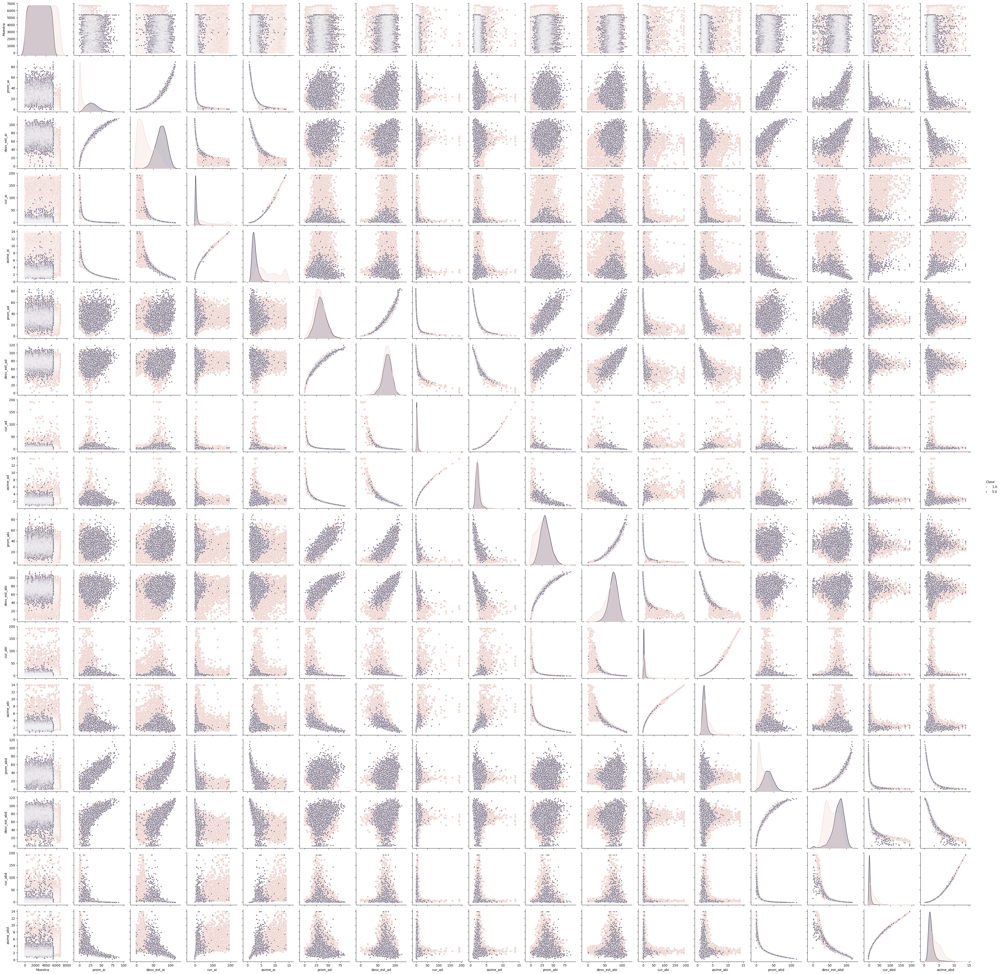

In [ ]:
# Grafico de dispersion

sns.pairplot(filtered_dataClean, hue="Clase", markers=["o", "*"])

Histograma de caracteristicas

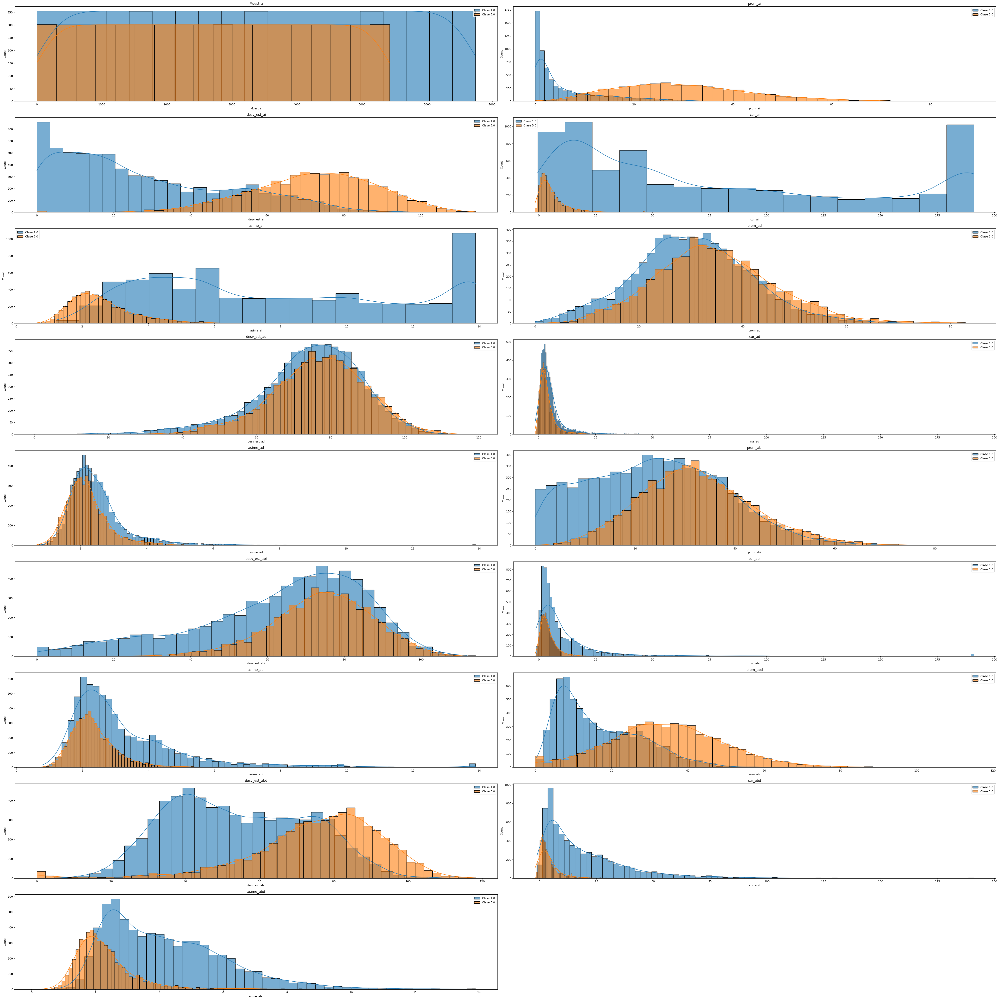

In [ ]:
# Agrupar por la clase
gruposClase = filtered_dataClean.groupby('Clase')

# Obtener las características (columnas) del conjunto de datos
caracteristicas = filtered_dataClean.drop(['Clase'], axis = 1).columns

# Definir el tamaño del gráfico y el número de filas y columnas
plt.figure(figsize = (50, 50))
num_filas = 9
num_columnas = 2
for i, caracteristica in enumerate(caracteristicas):  # Iterar sobre cada característica y trazar un histograma para cada clase
    plt.subplot(num_filas, num_columnas, i+1)
    for clase, grupo in gruposClase:
        sns.histplot(grupo[caracteristica], kde=True, label=f'Clase {clase}', alpha=0.6)
    plt.title(caracteristica)
    plt.legend()

plt.tight_layout()
plt.show()

Grafica De Calor - Correlacion

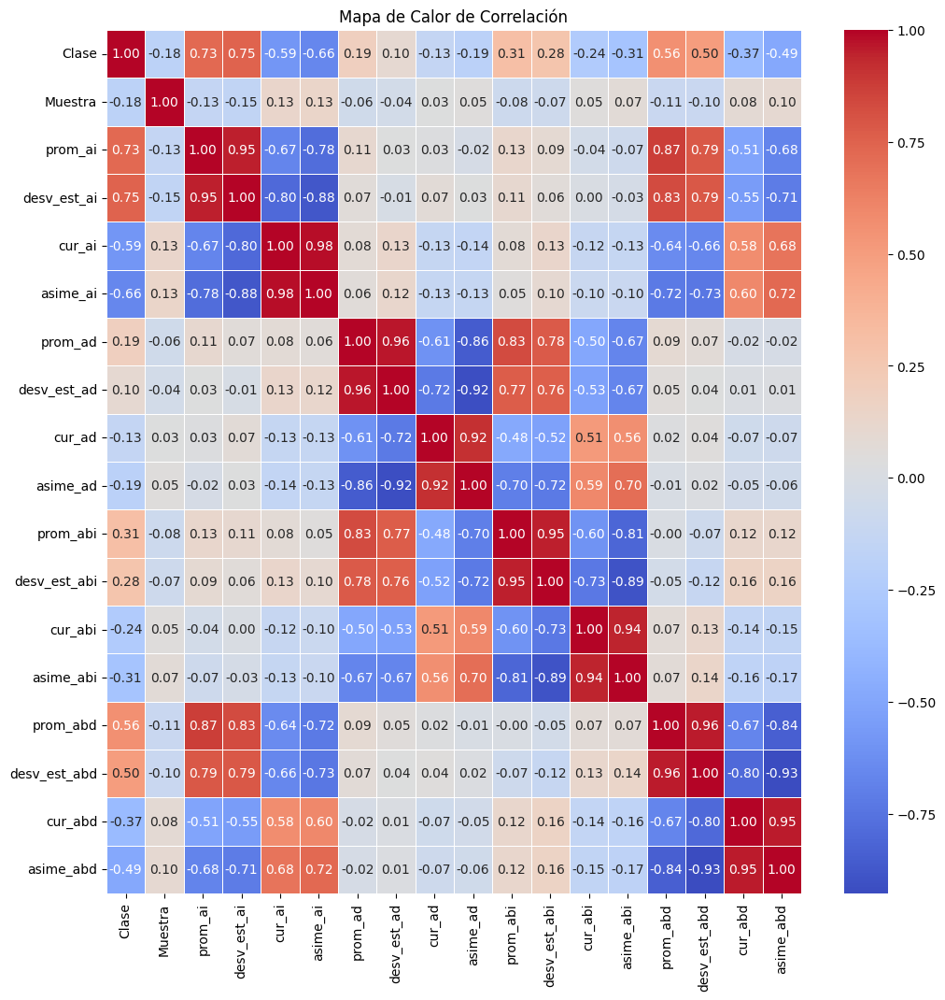

In [ ]:
# Calcular la matriz de correlación
matrizCorrelacion = filtered_dataClean.corr()

# Mapa de calor
plt.figure(figsize = (12, 12))
sns.heatmap(matrizCorrelacion, annot = True, cmap = "coolwarm", fmt = ".2f", linewidths = 0.5)
plt.title("Mapa de Calor de Correlación")
plt.show()

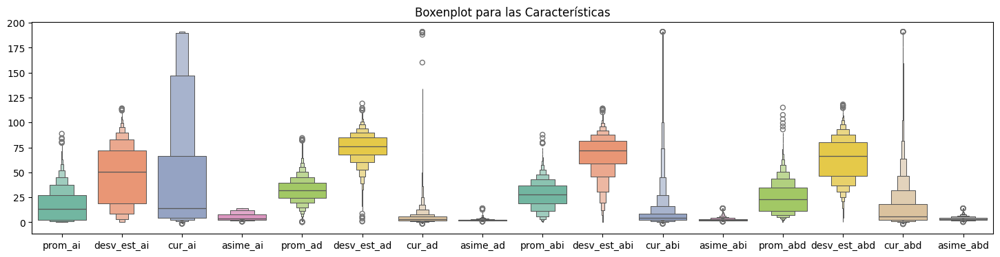

In [ ]:
# Grafica Boxenplot

dataBox = filtered_dataClean.drop(['Clase', 'Muestra'], axis=1)

plt.figure(figsize = (18, 4))
sns.boxenplot(data = dataBox, palette="Set2")
plt.title("Boxenplot para las Características")
plt.show()

# Busqueda Mejores Caracteristicas (Feature Selection)

Se utilizara los codigos visto en clase para obtener las mejores caracteristicas:

* **Information Gain:** La ganancia de información calcula la reducción de entropía a partir de la transformación de un conjunto de datos. Se puede utilizar para la selección de características evaluando la ganancia de información de cada variable en el contexto de la variable objetivo.

         Feature  Mutual_Info_Score
0        prom_ai           0.384376
2         cur_ai           0.373575
1    desv_est_ai           0.369947
3       asime_ai           0.369945
15     asime_abd           0.202074
12      prom_abd           0.201990
14       cur_abd           0.189982
13  desv_est_abd           0.170440
11     asime_abi           0.081232
8       prom_abi           0.070901
10       cur_abi           0.065729
9   desv_est_abi           0.046817
7       asime_ad           0.033275
4        prom_ad           0.030101
6         cur_ad           0.023055
5    desv_est_ad           0.002903


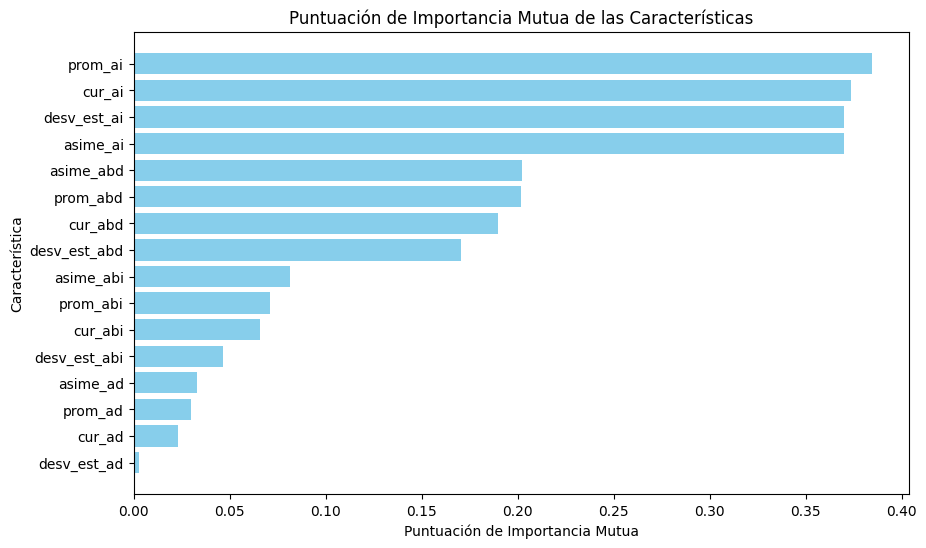

In [ ]:
# Division del conjunto de datos en características (X) y la variable objetivo (y)
X = filtered_dataClean.drop(['Clase', 'Muestra'], axis = 1)
y = filtered_dataClean['Clase']

# Calcula la importancia mutua de las características con respecto a la variable objetivo
feature_scores = mutual_info_classif(X, y, discrete_features='auto', random_state=42)

# Crea un DataFrame para visualizar las puntuaciones de importancia mutua por característica
feature_scores_df = pd.DataFrame({'Feature': X.columns, 'Mutual_Info_Score': feature_scores})
feature_scores_df = feature_scores_df.sort_values(by='Mutual_Info_Score', ascending=False)

# Visualiza las puntuaciones de importancia mutua
print(feature_scores_df)

# Gráfica de barras de las puntuaciones de importancia mutua
plt.figure(figsize=(10, 6))
plt.barh(feature_scores_df['Feature'], feature_scores_df['Mutual_Info_Score'], color='skyblue')
plt.xlabel('Puntuación de Importancia Mutua')
plt.ylabel('Característica')
plt.title('Puntuación de Importancia Mutua de las Características')
plt.gca().invert_yaxis()  # Invierte el orden de las características para mostrar la más importante en la parte superior
plt.show()

**Fisher's Score**:La idea clave de la puntuación de Fisher es encontrar un subconjunto de características, de modo que en el espacio de datos abarcado por las características seleccionadas, las distancias entre puntos de datos de diferentes clases sean lo más grandes posible, mientras que las distancias entre puntos de datos de la misma clase sean lo más pequeños posibles.

         Feature  Fisher_Score        P-Value
1    desv_est_ai  15697.767424   0.000000e+00
0        prom_ai  13665.845489   0.000000e+00
3       asime_ai   9630.625469   0.000000e+00
2         cur_ai   6361.073062   0.000000e+00
12      prom_abd   5559.727739   0.000000e+00
13  desv_est_abd   4029.578933   0.000000e+00
15     asime_abd   3797.873913   0.000000e+00
14       cur_abd   1971.972947   0.000000e+00
11     asime_abi   1292.428823  4.514559e-269
8       prom_abi   1292.125011  5.179600e-269
9   desv_est_abi   1008.786226  9.423782e-213
10       cur_abi    768.814578  3.895528e-164
4        prom_ad    449.361167   5.815585e-98
7       asime_ad    431.795100   2.844290e-94
6         cur_ad    218.682056   4.673368e-49
5    desv_est_ad    119.392111   1.155502e-27


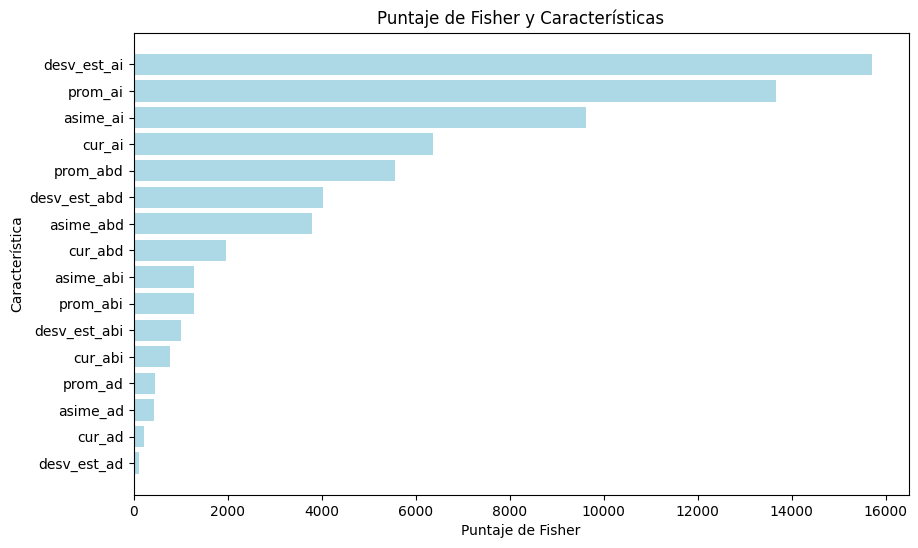

In [ ]:
# Calcular el puntaje de Fisher
f_scores, p_values = f_classif(X, y)

# Crear un DataFrame para visualizar los puntajes de Fisher
fisher_scores_df = pd.DataFrame({'Feature': X.columns, 'Fisher_Score': f_scores, 'P-Value': p_values})

# Ordenar por puntaje de Fisher en orden descendente
fisher_scores_df = fisher_scores_df.sort_values(by='Fisher_Score', ascending=False)

# Visualizar la tabla de resultados
print(fisher_scores_df)

# Crear una figura y ejes para graficar los puntajes de Fisher
plt.figure(figsize=(10, 6))
ax = plt.gca()

# Barra para todas las características
plt.barh(fisher_scores_df['Feature'], fisher_scores_df['Fisher_Score'], color='lightblue')
plt.xlabel('Puntaje de Fisher')
plt.ylabel('Característica')
plt.title('Puntaje de Fisher y Características')

# Invertir el orden de las características para mostrar la más importante en la parte superior
ax.invert_yaxis()

# Mostrar el gráfico
plt.show()

**Variance Threshold**: El umbral de variación es un enfoque básico simple para la selección de características. Elimina todas las funciones cuya variación no alcanza algún umbral. De forma predeterminada, elimina todas las características de variación cero, es decir, características con el mismo valor en todas las muestras. Suponemos que las características con una varianza más alta pueden contener información más útil, pero tenga en cuenta que no estamos tomando en cuenta la relación entre las variables de características o las variables de características y de destino, lo cual es uno de los inconvenientes de los métodos de filtrado.

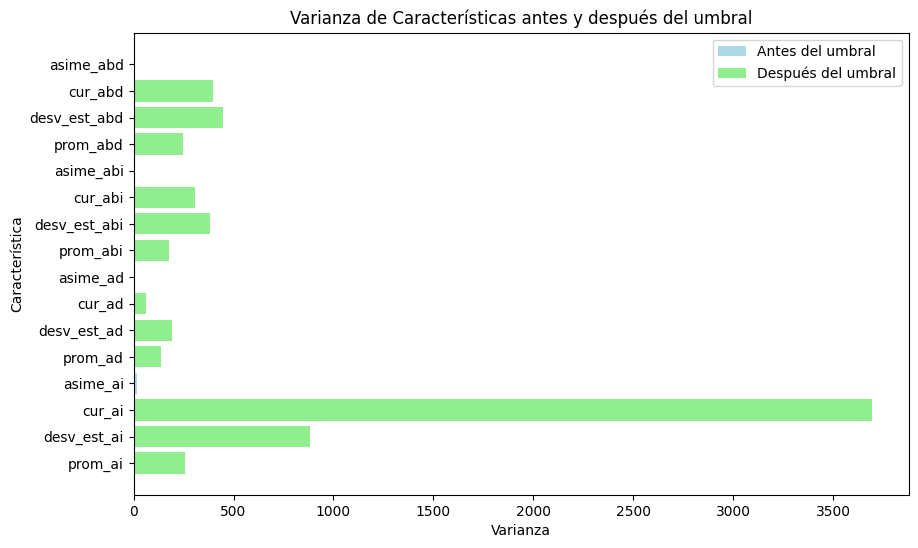

Características seleccionadas:
Index(['prom_ai', 'desv_est_ai', 'cur_ai', 'prom_ad', 'desv_est_ad', 'cur_ad',
       'prom_abi', 'desv_est_abi', 'cur_abi', 'prom_abd', 'desv_est_abd',
       'cur_abd'],
      dtype='object')
Dimensiones del DataFrame con características de alta varianza: (12163, 12)


In [ ]:
# Calcular la varianza de cada característica antes de aplicar el umbral
variances_before = X.var()

# Crear un objeto VarianceThreshold con un umbral específico (ajusta el valor según tus necesidades)
threshold = 25  # Ejemplo de umbral, puedes ajustarlo
variance_selector = VarianceThreshold(threshold)

# Ajustar el selector a tus datos
X_high_variance = variance_selector.fit_transform(X)

# Obtener las características seleccionadas
selected_features = X.columns[variance_selector.get_support()]

# Calcular la varianza de cada característica después de aplicar el umbral
variances_after = X[selected_features].var()

# Crear un gráfico para comparar la varianza antes y después de aplicar el umbral
plt.figure(figsize=(10, 6))
plt.barh(X.columns, variances_before, color='lightblue', label='Antes del umbral')
plt.barh(selected_features, variances_after, color='lightgreen', label='Después del umbral')
plt.xlabel('Varianza')
plt.ylabel('Característica')
plt.title('Varianza de Características antes y después del umbral')
plt.legend()

# Mostrar el gráfico
plt.show()

# Imprimir las características seleccionadas
print('Características seleccionadas:')
print(selected_features)

# Crear un nuevo DataFrame con las características seleccionadas
high_variance = filtered_dataClean[selected_features]

# Verificar las dimensiones del nuevo DataFrame
print('Dimensiones del DataFrame con características de alta varianza:', high_variance.shape)

**Metodo de la diferencia absoluta (MAD)**: Es una medida estadística utilizada para evaluar la dispersión o variabilidad de un conjunto de datos. Proporciona una medida robusta de la variabilidad de los datos al calcular la diferencia absoluta entre cada punto de datos y la media de esos datos, y luego tomando la media de esas diferencias absolutas.

 El MAD es una medida de dispersión robusta que es menos sensible a valores atípicos o extremos en los datos que otras medidas de dispersión, como la desviación estándar. Por lo tanto, se utiliza a menudo cuando se desea evaluar la variabilidad de un conjunto de datos sin verse afectado significativamente por valores atípicos.

                   Feature  MAD_Score
cur_ai              cur_ai  48.475575
desv_est_ai    desv_est_ai  26.180666
desv_est_abd  desv_est_abd  17.818121
desv_est_abi  desv_est_abi  14.915912
prom_ai            prom_ai  13.334983
cur_abd            cur_abd  13.185630
prom_abd          prom_abd  12.865948
prom_abi          prom_abi  10.688336
desv_est_ad    desv_est_ad  10.644870
prom_ad            prom_ad   9.147709
cur_abi            cur_abi   8.623324
cur_ad              cur_ad   3.581094
asime_ai          asime_ai   3.272153
asime_abd        asime_abd   1.466727
asime_abi        asime_abi   1.001854
asime_ad          asime_ad   0.581431


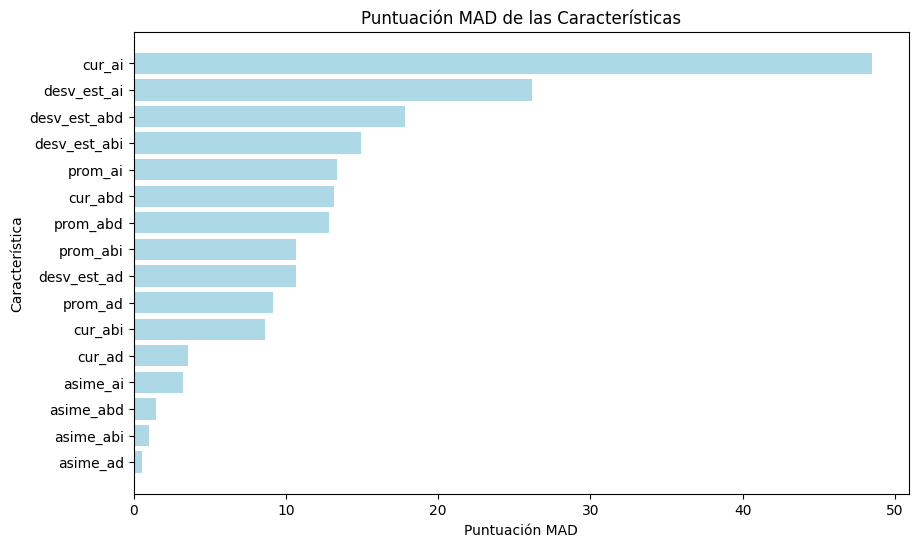

In [ ]:
# Calcular la Mean Absolute Difference (MAD) para cada característica
mean_absolute_differences = np.mean(np.abs(X - np.mean(X, axis=0)), axis=0)

# Crear un DataFrame para visualizar las puntuaciones MAD por característica
mad_scores_df = pd.DataFrame({'Feature': X.columns, 'MAD_Score': mean_absolute_differences})

# Ordenar por puntuación MAD en orden descendente
mad_scores_df = mad_scores_df.sort_values(by='MAD_Score', ascending=False)

# Visualizar la tabla de puntuaciones MAD
print(mad_scores_df)

# Gráfica de barras de las puntuaciones MAD
plt.figure(figsize=(10, 6))
plt.barh(mad_scores_df['Feature'], mad_scores_df['MAD_Score'], color='lightblue')
plt.xlabel('Puntuación MAD')
plt.ylabel('Característica')
plt.title('Puntuación MAD de las Características')
plt.gca().invert_yaxis()  # Invierte el orden de las características para mostrar la más importante en la parte superior
plt.show()

Despues de toda estas metodologias de analisis de datos para elegir las caracteristicas se decidio a elegir las siguientes para la creacion de una prueba y graficas

# 2 Caracteristicas

## Estandarización

In [ ]:
features = filtered_dataClean[['cur_ai', 'desv_est_ai']]
y = filtered_dataClean['Clase']

# Estandarización
scaler = StandardScaler()
X_std = scaler.fit_transform(features)

print(X_std)
print(y)

[[ 1.87332498 -1.32834756]
 [-0.63115982  0.55698384]
 [-0.42661297 -0.01729118]
 ...
 [-0.58313377  0.29832497]
 [-0.42216462 -0.17283984]
 [-0.70019097  0.95244086]]
5923     1.0
5924     1.0
5925     1.0
5926     1.0
5927     1.0
        ... 
36012    5.0
36013    5.0
36014    5.0
36015    5.0
36016    5.0
Name: Clase, Length: 12163, dtype: float64


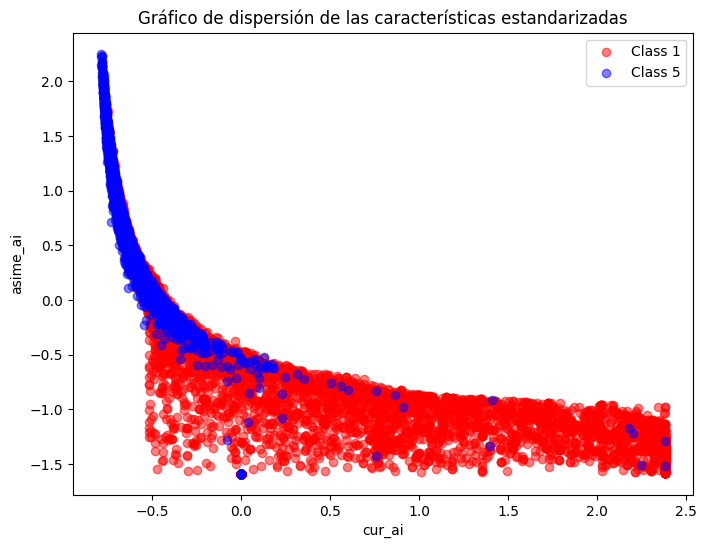

In [ ]:
# Grafica Dispersion

plt.figure(figsize = (8, 6))
plt.scatter(X_std[y == 1, 0], X_std[y == 1, 1], color = 'red', alpha = 0.5, label = 'Class 1')
plt.scatter(X_std[y == 5, 0], X_std[y ==5, 1], color = 'blue', alpha = 0.5, label = 'Class 5')
plt.title('Gráfico de dispersión de las características estandarizadas')
plt.xlabel('cur_ai')
plt.ylabel('asime_ai')
plt.legend()
plt.show()

In [ ]:
# Entrenamientos y testeos

X_train, X_test, y_train, y_test = train_test_split(features, y, test_size = 0.25, random_state = 42)

sc = StandardScaler()
sc.fit(X_train)
X_train_std = sc.transform(X_train)
X_test_std = sc.transform(X_test)
print(X_train_std)

[[-0.72939213  1.2208892 ]
 [-0.68771038  0.93565963]
 [-0.6449924   0.59228538]
 ...
 [ 0.50350652 -1.34769011]
 [-0.43389017 -0.13198817]
 [-0.52690298  0.12662409]]


Se procede a realizar una extracción de los datos para la conformación de los datos de entrenamiento y testeo. En este caso particular, el 25% de 60.000 es 15000 de prueba y 75% o sea 45000 de entrenamiento.

In [ ]:
# Chequeo

print('Conteo de etiquetas en y:', np.bincount(y))
print('Conteo de etiquetas en y_train:', np.bincount(y_train))
print('Conteo de etiquetas en y_test:', np.bincount(y_test))

Conteo de etiquetas en y: [   0 6742    0    0    0 5421]
Conteo de etiquetas en y_train: [   0 5015    0    0    0 4107]
Conteo de etiquetas en y_test: [   0 1727    0    0    0 1314]


In [ ]:
# Validacion de datos

promedio_X1 = X_train_std[:,0].mean()
desv_estand_X1 = X_train_std[:,0].std()
promedio_X2 = X_train_std[:,1].mean()
desv_estand_X2 = X_train_std[:,1].std()

print("Promedio de la característica 1 X1: " + str(promedio_X1))
print("Desviacion estandar de la característica 1 X1: " + str(desv_estand_X1))
print("Promedio de la característica 2 X2: " + str(promedio_X2))
print("Desviacion estandar de la característica 2 X2: " + str(desv_estand_X2))

Promedio de la característica 1 X1: -8.178797111906437e-18
Desviacion estandar de la característica 1 X1: 1.0
Promedio de la característica 2 X2: -1.4176581660637824e-16
Desviacion estandar de la característica 2 X2: 1.0


## SVC (vía SCI-KIT learn)

In [ ]:
# Entrenamientos SVC

# Modelo SVM con kernel lineal
svm_linear = SVC(kernel = 'linear', C = 100.0, random_state = 1)
svm_linear.fit(X_train_std, y_train)

SVC(C=100.0, kernel='linear', random_state=1)

In [ ]:
# Modelo SVM con kernel radial (Gaussian)
svm_rbf = SVC(kernel = 'rbf')
svm_rbf.fit(X_train_std, y_train)

SVC()

Una vez entrenado cada modelo, se realiza la evaluación rapida (solo para validar la clasificación y resultado rapido)

In [ ]:
y_pred1 = svm_linear.predict(X_test_std)  # Modelo Linear
y_pred2 = svm_rbf.predict(X_test_std)     # Modelo gausiano
print('Cantidad de muestras de clasificación errónea en modelo linear: %d' %  (y_test != y_pred1).sum())
print('Cantidad de muestras de clasificación errónea en modelo gaussiano: %d' %  (y_test != y_pred2).sum())

Cantidad de muestras de clasificación errónea en modelo linear: 459
Cantidad de muestras de clasificación errónea en modelo gaussiano: 470


Lo cual son muy buenos valores teniendo en cuenta que son 60.000 muestras en total.

In [ ]:
# Evaluacion de precision de cada modelo

accuracy_linear = accuracy_score(y_test, y_pred1)
accuracy_rbf = accuracy_score(y_test, y_pred2)

print("Precisión del modelo SVM con kernel lineal:", accuracy_linear)
print("Precisión del modelo SVM con kernel radial (Gaussian):", accuracy_rbf)

Precisión del modelo SVM con kernel lineal: 0.8490628082867477
Precisión del modelo SVM con kernel radial (Gaussian): 0.8454455771127919


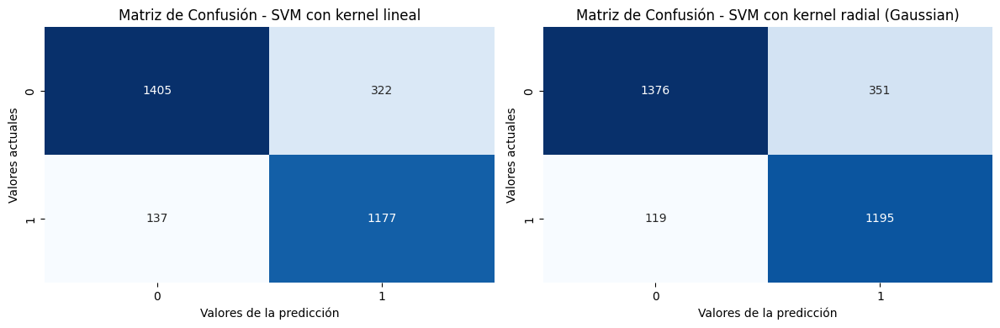

In [ ]:
# Graficas de confusion

# Modelo SVM lineal
confMatrixLinear = confusion_matrix(y_test, y_pred1)

# Modelo SVM gausiano
confMatrixRbf = confusion_matrix(y_test, y_pred2)

fig, axs = plt.subplots(1, 2, figsize=(12, 4))
# Primer subplot para el modelo SVM con kernel lineal
sns.heatmap(confMatrixLinear, annot=True, cmap='Blues', fmt='g', cbar=False, ax=axs[0])
axs[0].set_xlabel('Valores de la predicción')
axs[0].set_ylabel('Valores actuales')
axs[0].set_title('Matriz de Confusión - SVM con kernel lineal')
# Segundo subplot para el modelo SVM con kernel radial
sns.heatmap(confMatrixRbf, annot=True, cmap='Blues', fmt='g', cbar=False, ax=axs[1])
axs[1].set_xlabel('Valores de la predicción')
axs[1].set_ylabel('Valores actuales')
axs[1].set_title('Matriz de Confusión - SVM con kernel radial (Gaussian)')
plt.tight_layout()
plt.show()

**Analisis:**

1. Modelo SVM con kernel lineal: SVM con kernel lineal:
 * Verdaderos positivos (TP): 1405
 * Falsos positivos (FP): 322
 * Falsos negativos (FN): 137
 * Verdaderos negativos (TN): 1177

 Este modelo tiene un buen número de TP y TN, lo que indica que está clasificando correctamente tanto las muestras positivas como las negativas. Sin embargo, el número de FP y FN no es tan bajo, lo que significa que aún hay un número considerable de errores en la clasificación.

2. Modelo SVM con kernel radial (Gaussian):
 * Verdaderos positivos (TP): 1376
 * Falsos positivos (FP): 351
 * Falsos negativos  (FN): 119
 * Verdaderos negativos (TN): 1195

 Este modelo también tiene un buen número de TP y TN, y en comparación con el modelo lineal, tiene menos errores tanto en FP como en FN.

Ambos modelos muestran un rendimiento generalmente bueno en la clasificación.
Sin embargo, el modelo SVM con kernel gaussiano tiene menos errores en la clasificación, ya que tiene menos FP y FN en comparación con el modelo lineal.
Por lo tanto, en base a estas matrices de confusión, se podría concluir que el modelo SVM con kernel gaussiano es mejor para este problema de clasificación

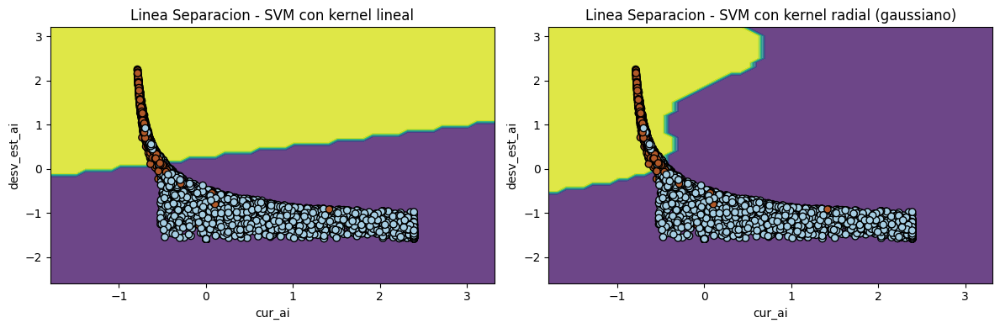

In [ ]:
# Grafica de dispersion con linea de separacion.

# Crear una malla para visualizar las superficies de decisión
x_min, x_max = X_train_std[:, 0].min() - 1, X_train_std[:, 0].max() + 1
y_min, y_max = X_train_std[:, 1].min() - 1, X_train_std[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))

# Hacer predicciones en la malla
Z_linear = svm_linear.predict(np.c_[xx.ravel(), yy.ravel()])
Z_linear = Z_linear.reshape(xx.shape)
Z_rbf = svm_rbf.predict(np.c_[xx.ravel(), yy.ravel()])
Z_rbf = Z_rbf.reshape(xx.shape)

# Modelo SCV linear
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.contourf(xx, yy, Z_linear, alpha=0.8)
plt.scatter(X_train_std[:, 0], X_train_std[:, 1], c=y_train, cmap=plt.cm.Paired, edgecolors='k')
plt.title('Linea Separacion - SVM con kernel lineal')
plt.xlabel('cur_ai')
plt.ylabel('desv_est_ai')

# Modelo SCV Gausiano
plt.subplot(1, 2, 2)
plt.contourf(xx, yy, Z_rbf, alpha=0.8)
plt.scatter(X_train_std[:, 0], X_train_std[:, 1], c=y_train, cmap=plt.cm.Paired, edgecolors='k')
plt.title('Linea Separacion - SVM con kernel radial (gaussiano)')
plt.xlabel('cur_ai')
plt.ylabel('desv_est_ai')
plt.tight_layout()
plt.show()

## KNN (vía SCI-KIT learn)

In [ ]:
# Entrenamiendo KNN

# Modelo KNN con algoritmo de fuerza bruta
knn_brute = KNeighborsClassifier(algorithm='brute')
knn_brute.fit(X_train_std, y_train)


KNeighborsClassifier(algorithm='brute')

In [ ]:
# Modelo KNN con algoritmo de arbol
knn_ball = KNeighborsClassifier(algorithm='ball_tree')
knn_ball.fit(X_train_std, y_train)

KNeighborsClassifier(algorithm='ball_tree')

In [ ]:
# Modelo KNN automatico
knn_kd = KNeighborsClassifier(algorithm = "kd_tree", p = 1)
knn_kd.fit(X_train_std, y_train)

KNeighborsClassifier(algorithm='kd_tree', p=1)

Evaluacion rapida de la clasificacion

In [ ]:
y_pred_1 = knn_brute.predict(X_test_std)   # Modelo bruto
y_pred_2 = knn_ball.predict(X_test_std)    # Modelo arbol
y_pred_3 = knn_kd.predict(X_test_std)    # Modelo arbol
print("Cantidad de muestras de clasificacion erronea en modelo linear: %d" % (y_test != y_pred_1).sum())
print("Cantidad de muestras de clasificacion errone en modelo arbol %d" % (y_test != y_pred_2).sum())
print("Cantidad de muestras de clasificacion errone en modelo kd %d" % (y_test != y_pred_3).sum())

Cantidad de muestras de clasificacion erronea en modelo linear: 496
Cantidad de muestras de clasificacion errone en modelo arbol 496
Cantidad de muestras de clasificacion errone en modelo kd 487


In [ ]:
# Evaluacion de precision de cada modelo

accuracy_brute = accuracy_score(y_test, y_pred_1)
accuracy_ball = accuracy_score(y_test, y_pred_2)
accuracy_kd = accuracy_score(y_test, y_pred_3)

print("Precision del modelo knn con fuerza bruta:", accuracy_brute)
print("Precision del modelo knn con fuerza bruta:", accuracy_ball)
print("Precision del modelo knn con fuerza bruta:", accuracy_kd)

Precision del modelo knn con fuerza bruta: 0.8368957579743506
Precision del modelo knn con fuerza bruta: 0.8368957579743506
Precision del modelo knn con fuerza bruta: 0.8398553107530418


Text(0.5, 1.0, 'Matriz de Confusion - KNN Kd Tree')

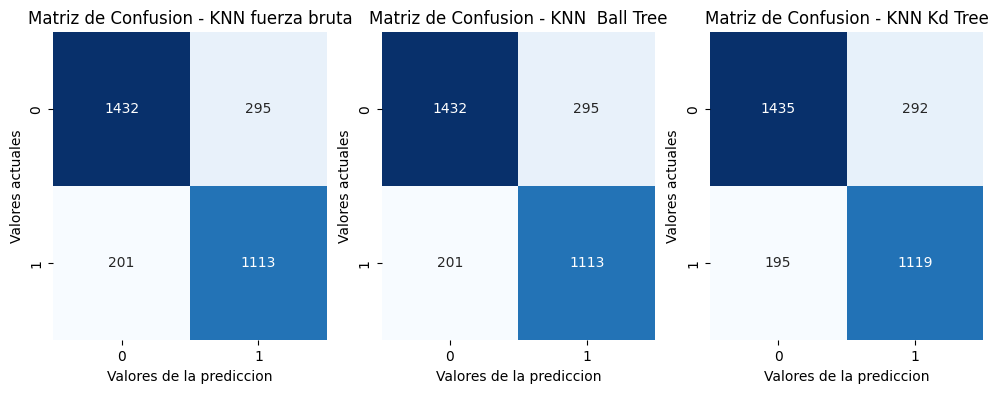

In [ ]:
# Grafica de confusion

# Modelo knn brute
confMatrix_brute = confusion_matrix(y_test, y_pred_1)

# Modelo knn ball tree
confMatrix_ball = confusion_matrix(y_test, y_pred_2)

# Modelo knn kd tree
confMatrix_kd = confusion_matrix(y_test, y_pred_3)


fig, axs = plt.subplots(1, 3, figsize = (12, 4))
#Primer modelo
sns.heatmap(confMatrix_brute, annot = True, cmap = 'Blues', fmt = 'g', cbar = False, ax = axs[0])
axs[0].set_xlabel('Valores de la prediccion')
axs[0].set_ylabel('Valores actuales')
axs[0].set_title('Matriz de Confusion - KNN fuerza bruta')

#Primer modelo
sns.heatmap(confMatrix_ball, annot = True, cmap = 'Blues', fmt = 'g', cbar = False, ax = axs[1])
axs[1].set_xlabel('Valores de la prediccion')
axs[1].set_ylabel('Valores actuales')
axs[1].set_title('Matriz de Confusion - KNN  Ball Tree')

#Primer modelo
sns.heatmap(confMatrix_kd, annot = True, cmap = 'Blues', fmt = 'g', cbar = False, ax = axs[2])
axs[2].set_xlabel('Valores de la prediccion')
axs[2].set_ylabel('Valores actuales')
axs[2].set_title('Matriz de Confusion - KNN Kd Tree')

**Analisis:**

Los tres modelos muestran un rendimiento generalmente bueno en la clasificación.
Sin embargo, en una primer instancia generaron los mismos resultados, asi que se procedio a cambiar el valor p, el cual consiste en como calcular la distancia con la distancia manhatan(1) o con la distancia euclidiana(2), ya que los 3 modelos dieron los mismo resultados se cambio el paramentro en el modelo de kd tree lo cual se puede evidenciar que genero un resultado diferente con un menor numero de errores y tambien una grafica diferente, pero aun asi el porcentaje de prediccion no cambio demasiado.

Text(0, 0.5, 'desv_est_ai')

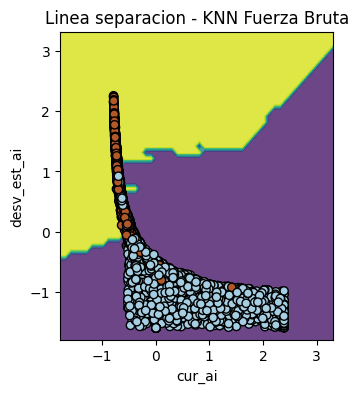

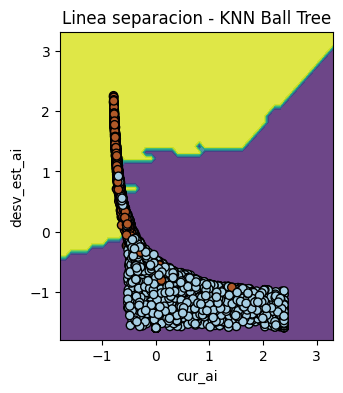

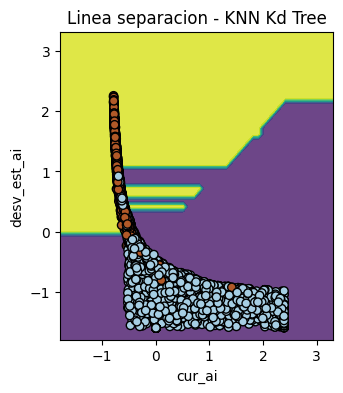

In [ ]:
# Grafica de dispersion con linea de separacion

# cRear una malla para visualziar las superficies de decision
x_min, x_max = X_train_std[:,0].min() - 1, X_train_std[:,0].max() + 1
y_min, y_max = X_train_std[:,0].min() - 1, X_train_std[:,0].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))

#Hacer predcciones en la malla
z_brute = knn_brute.predict(np.c_[xx.ravel(),yy.ravel()])
z_brute = z_brute.reshape(xx.shape)
z_ball = knn_ball.predict(np.c_[xx.ravel(),yy.ravel()])
z_ball = z_ball.reshape(xx.shape)
z_kd = knn_kd.predict(np.c_[xx.ravel(),yy.ravel()])
z_kd = z_kd.reshape(xx.shape)

# KKN brute
plt.figure(figsize = (12,4))
plt.subplot(1,3,1)
plt.contourf(xx,yy,z_brute,alpha=0.8)
plt.scatter(X_train_std[:,0],X_train_std[:,1],c = y_train, cmap=plt.cm.Paired, edgecolors ='k')
plt.title('Linea separacion - KNN Fuerza Bruta')
plt.xlabel('cur_ai')
plt.ylabel('desv_est_ai')
#knn ball tree
plt.figure(figsize = (12,4))
plt.subplot(1,3,2)
plt.contourf(xx,yy,z_ball,alpha=0.8)
plt.scatter(X_train_std[:,0],X_train_std[:,1],c = y_train, cmap=plt.cm.Paired, edgecolors ='k')
plt.title('Linea separacion - KNN Ball Tree')
plt.xlabel('cur_ai')
plt.ylabel('desv_est_ai')
#knn kd tree
plt.figure(figsize = (12,4))
plt.subplot(1,3,3)
plt.contourf(xx,yy,z_kd,alpha=0.8)
plt.scatter(X_train_std[:,0],X_train_std[:,1],c = y_train, cmap=plt.cm.Paired, edgecolors ='k')
plt.title('Linea separacion - KNN Kd Tree')
plt.xlabel('cur_ai')
plt.ylabel('desv_est_ai')

# 4 Caracteristicas

## Estandarización

In [ ]:
features2 = filtered_dataClean[['cur_ai', 'desv_est_ai', 'desv_est_abd', 'desv_est_abi']]
y2 = filtered_dataClean['Clase']

# Estandarización
scaler = StandardScaler()
X_std2 = scaler.fit_transform(features)


print(X_std2)
print(y2)

[[ 1.87332498 -1.32834756]
 [-0.63115982  0.55698384]
 [-0.42661297 -0.01729118]
 ...
 [-0.58313377  0.29832497]
 [-0.42216462 -0.17283984]
 [-0.70019097  0.95244086]]
5923     1.0
5924     1.0
5925     1.0
5926     1.0
5927     1.0
        ... 
36012    5.0
36013    5.0
36014    5.0
36015    5.0
36016    5.0
Name: Clase, Length: 12163, dtype: float64


No se puede realizar el grafico con 4 clases, por lo cual se omitira el grafico de dispersion.

In [ ]:
# Entrenamientos y testeos

X_train2, X_test2, y_train2, y_test2 = train_test_split(features2, y2, test_size = 0.25, random_state = 42)

sc = StandardScaler()
sc.fit(X_train2)
X_train_std2 = sc.transform(X_train2)
X_test_std2 = sc.transform(X_test2)
print(X_train_std2)

[[-0.72939213  1.2208892   1.03767989  0.62881888]
 [-0.68771038  0.93565963  0.85156139  0.8104031 ]
 [-0.6449924   0.59228538  0.74354    -1.43678223]
 ...
 [ 0.50350652 -1.34769011 -0.65820378 -0.29331652]
 [-0.43389017 -0.13198817  0.45187063 -2.12494681]
 [-0.52690298  0.12662409 -0.53304529 -0.14004117]]


Se procede a realizar una extracción de los datos para la conformación de los datos de entrenamiento y testeo. En este caso particular, el 25% de 60.000 es 15000 de prueba y 75% osea 45000 de entrenamiento.

In [ ]:
# Chequeo

print('Conteo de etiquetas en y:', np.bincount(y2))
print('Conteo de etiquetas en y_train:', np.bincount(y_train2))
print('Conteo de etiquetas en y_test:', np.bincount(y_test2))

Conteo de etiquetas en y: [   0 6742    0    0    0 5421]
Conteo de etiquetas en y_train: [   0 5015    0    0    0 4107]
Conteo de etiquetas en y_test: [   0 1727    0    0    0 1314]


In [ ]:
# Validacion de datos

promedio_X11 = X_train_std2[:,0].mean()
desv_estand_X12 = X_train_std2[:,0].std()
promedio_X21 = X_train_std2[:,1].mean()
desv_estand_X22 = X_train_std2[:,1].std()
promedio_X31 = X_train_std2[:,2].mean()
desv_estand_X32 = X_train_std2[:,2].std()
promedio_X41 = X_train_std2[:,3].mean()
desv_estand_X42 = X_train_std2[:,3].std()

print("Promedio de la característica 1 X1: " + str(promedio_X11))
print("Desviacion estandar de la característica 1 X1: " + str(desv_estand_X12))
print("Promedio de la característica 2 X2: " + str(promedio_X21))
print("Desviacion estandar de la característica 2 X2: " + str(desv_estand_X22))
print("Promedio de la característica 3 X3: " + str(promedio_X31))
print("Desviacion estandar de la característica 3 X3: " + str(desv_estand_X32))
print("Promedio de la característica 4 X4: " + str(promedio_X41))
print("Desviacion estandar de la característica 4 X4: " + str(desv_estand_X42))

Promedio de la característica 1 X1: -8.178797111906437e-18
Desviacion estandar de la característica 1 X1: 1.0
Promedio de la característica 2 X2: -1.4176581660637824e-16
Desviacion estandar de la característica 2 X2: 1.0
Promedio de la característica 3 X3: 2.913209637955245e-16
Desviacion estandar de la característica 3 X3: 1.0
Promedio de la característica 4 X4: 3.115732233107214e-17
Desviacion estandar de la característica 4 X4: 1.0


## SVC (vía SCI-KIT learn)

In [ ]:
# Entrenamientos SVC

# Modelo SVM con kernel lineal
svm_linear2 = SVC(kernel = 'linear', C = 100.0, random_state = 1)
svm_linear2.fit(X_train_std2, y_train2)

In [ ]:
# Modelo SVM con kernel radial (Gaussian)
svm_rbf2 = SVC(kernel = 'rbf')
svm_rbf2.fit(X_train_std2, y_train2)

SVC()

Una vez entrenado cada modelo, se realiza la evaluación rapida (solo para validar la clasificación y resultado rapido)

In [ ]:
y_pred12 = svm_linear2.predict(X_test_std2)  # Modelo Linear
y_pred22 = svm_rbf2.predict(X_test_std2)     # Modelo gausiano
print('Cantidad de muestras de clasificación errónea en modelo linear: %d' %  (y_test2 != y_pred12).sum())
print('Cantidad de muestras de clasificación errónea en modelo gaussiano: %d' %  (y_test2 != y_pred22).sum())

Cantidad de muestras de clasificación errónea en modelo linear: 243
Cantidad de muestras de clasificación errónea en modelo gaussiano: 235


Lo cual son muy buenos valores teniendo en cuenta que son 60.000 muestras en total. De hecho, se reducieron la cantidad a cuando se realizo 2 caracteristicas, por lo tanto esto puede dar mejor indicativo de usar 4 caracteristicas.

In [ ]:
# Evaluacion de precision de cada modelo

accuracy_linear2 = accuracy_score(y_test2, y_pred12)
accuracy_rbf2 = accuracy_score(y_test2, y_pred22)

print("Precisión del modelo SVM con kernel lineal:", accuracy_linear2)
print("Precisión del modelo SVM con kernel radial (Gaussian):", accuracy_rbf2)

Precisión del modelo SVM con kernel lineal: 0.9200920749753371
Precisión del modelo SVM con kernel radial (Gaussian): 0.9227227885563959


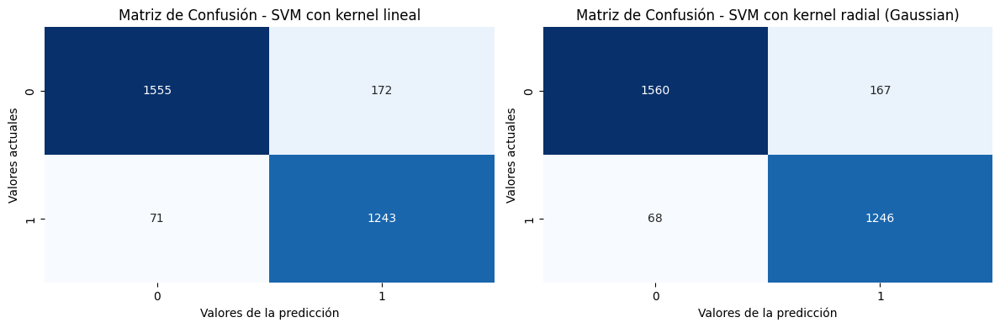

In [ ]:
# Graficas de confusion

# Modelo SVM lineal
confMatrixLinear2 = confusion_matrix(y_test2, y_pred12)

# Modelo SVM gausiano
confMatrixRbf2 = confusion_matrix(y_test2, y_pred22)

fig, axs = plt.subplots(1, 2, figsize=(12, 4))
# Primer subplot para el modelo SVM con kernel lineal
sns.heatmap(confMatrixLinear2, annot=True, cmap='Blues', fmt='g', cbar=False, ax=axs[0])
axs[0].set_xlabel('Valores de la predicción')
axs[0].set_ylabel('Valores actuales')
axs[0].set_title('Matriz de Confusión - SVM con kernel lineal')
# Segundo subplot para el modelo SVM con kernel radial
sns.heatmap(confMatrixRbf2, annot=True, cmap='Blues', fmt='g', cbar=False, ax=axs[1])
axs[1].set_xlabel('Valores de la predicción')
axs[1].set_ylabel('Valores actuales')
axs[1].set_title('Matriz de Confusión - SVM con kernel radial (Gaussian)')
plt.tight_layout()
plt.show()

**Analisis:**

1. Modelo SVM con kernel lineal: SVM con kernel lineal:
 * Verdaderos positivos (TP): 1555
 * Falsos positivos (FP): 172
 * Falsos negativos (FN): 71
 * Verdaderos negativos (TN): 1243

 Este modelo tiene basicamente sigue la misma instructiva del modelo con 2 caracteristicas pero ha mejorado a diferencia, por lo cual tiene valores muy buenos y porca tendencia de fallar al realizar predicciones.

2. Modelo SVM con kernel radial (Gaussian):
 * Verdaderos positivos (TP): 1560
 * Falsos positivos (FP): 167
 * Falsos negativos  (FN): 68
 * Verdaderos negativos (TN): 1246

 En este modle ocurre algo similar a la explicacion anterior, puesto que ocurre lo mismo que con 2 caracteristicas pero mejoro aun mas.

Ambos modelos muestran un rendimiento generalmente bueno en la clasificación.
Sin embargo, el modelo SVM con kernel gaussiano tiene menos errores y muy pocos a comparacion de su version de 2 caractersiticas, por lo cual se puede decir que esta es la mejor version de todos los modelos de SCV que se realizaron, y de igual manera, el de linear aunque es bueno, aun sigue siendo mejor el gausiano.

## KNN (vía SCI-KIT learn)

In [ ]:
# Entrenamiendo KNN

# Modelo KNN con algoritmo de fuerza bruta
knn_brute = KNeighborsClassifier(algorithm='brute')
knn_brute.fit(X_train_std2, y_train2)


KNeighborsClassifier(algorithm='brute')

In [ ]:
# Modelo KNN con algoritmo de arbol
knn_ball = KNeighborsClassifier(algorithm='ball_tree')
knn_ball.fit(X_train_std2, y_train2)

KNeighborsClassifier(algorithm='ball_tree')

In [ ]:
# Modelo KNN automatico
knn_kd = KNeighborsClassifier(algorithm = "kd_tree", p = 1)
knn_kd.fit(X_train_std2, y_train2)

KNeighborsClassifier(algorithm='kd_tree', p=1)

In [ ]:
y_pred_11 = knn_brute.predict(X_test_std2)   # Modelo bruto
y_pred_22 = knn_ball.predict(X_test_std2)    # Modelo arbol
y_pred_33 = knn_kd.predict(X_test_std2)    # Modelo arbol
print("Cantidad de muestras de clasificacion erronea en modelo linear: %d" % (y_test2 != y_pred_11).sum())
print("Cantidad de muestras de clasificacion errone en modelo arbol %d" % (y_test2 != y_pred_22).sum())
print("Cantidad de muestras de clasificacion errone en modelo kd %d" % (y_test2 != y_pred_33).sum())

Cantidad de muestras de clasificacion erronea en modelo linear: 245
Cantidad de muestras de clasificacion errone en modelo arbol 245
Cantidad de muestras de clasificacion errone en modelo kd 260


In [ ]:
# Evaluacion de precision de cada modelo

accuracy_brute4 = accuracy_score(y_test2, y_pred_11)
accuracy_ball4 = accuracy_score(y_test2, y_pred_22)
accuracy_kd4 = accuracy_score(y_test2, y_pred_33)

print("Precision del modelo knn con fuerza bruta:", accuracy_brute4)
print("Precision del modelo knn con fuerza bruta:", accuracy_ball4)
print("Precision del modelo knn con fuerza bruta:", accuracy_kd4)

Precision del modelo knn con fuerza bruta: 0.9194343965800723
Precision del modelo knn con fuerza bruta: 0.9194343965800723
Precision del modelo knn con fuerza bruta: 0.9145018086155869


Text(0.5, 1.0, 'Matriz de Confusion - KNN Kd Tree')

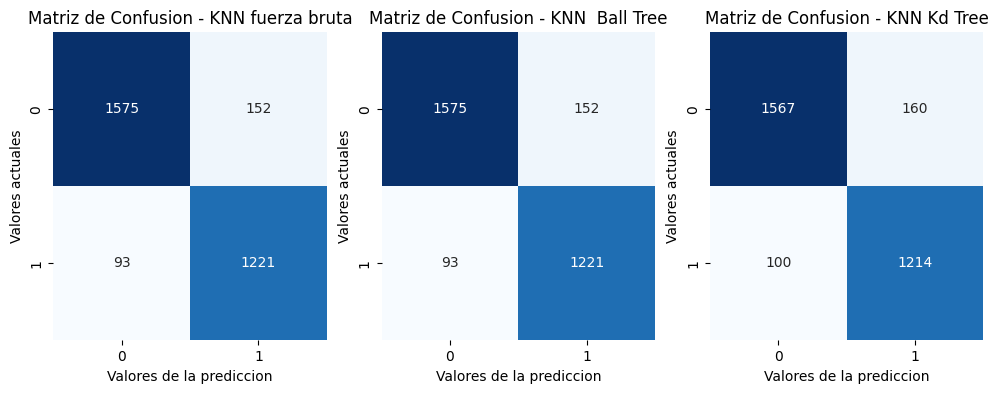

In [ ]:
# Grafica de confusion

# Modelo knn brute
confMatrix_brute4 = confusion_matrix(y_test2, y_pred_11)

# Modelo knn ball tree
confMatrix_ball4 = confusion_matrix(y_test2, y_pred_22)

# Modelo knn kd tree
confMatrix_kd4 = confusion_matrix(y_test2, y_pred_33)


fig, axs = plt.subplots(1, 3, figsize = (12, 4))
#Primer modelo
sns.heatmap(confMatrix_brute4, annot = True, cmap = 'Blues', fmt = 'g', cbar = False, ax = axs[0])
axs[0].set_xlabel('Valores de la prediccion')
axs[0].set_ylabel('Valores actuales')
axs[0].set_title('Matriz de Confusion - KNN fuerza bruta')

#Primer modelo
sns.heatmap(confMatrix_ball4, annot = True, cmap = 'Blues', fmt = 'g', cbar = False, ax = axs[1])
axs[1].set_xlabel('Valores de la prediccion')
axs[1].set_ylabel('Valores actuales')
axs[1].set_title('Matriz de Confusion - KNN  Ball Tree')

#Primer modelo
sns.heatmap(confMatrix_kd4, annot = True, cmap = 'Blues', fmt = 'g', cbar = False, ax = axs[2])
axs[2].set_xlabel('Valores de la prediccion')
axs[2].set_ylabel('Valores actuales')
axs[2].set_title('Matriz de Confusion - KNN Kd Tree')

**Analisis:**

Los tres modelos muestran un rendimiento generalmente bueno en la clasificación.
Sin embargo, en una primer instancia generaron los mismos resultados, asi que se procedio a cambiar el valor p, el cual consiste en como calcular la distancia con la distancia manhatan(1) o con la distancia euclidiana(2), ya que los 3 modelos dieron los mismo resultados se cambio el paramentro en el modelo de kd tree lo cual se puede evidenciar que genero un resultado diferente con un mayor numero de errores, pero aun asi el porcentaje de prediccion no cambio demasiado.

# Comparativas finales (SCV y KNN) y conclusiones

En conclusion los dos tipos de modelos tuvieron un desempeno similar, donde los modelos svc por muy poco obtuvieron un mejor rendimiendo que los Knn en 2 y 4 caracteristicas, lo cual puede ser resultado de las caracteristicas que elegimos.

Es evidente que a mas caracteristicas el porcentaje de errores disminuyo y el porcentaje de prediccion exitosa aumento, eso quiere decir que a mayor informacion de las muestras con una clasificacion de la informacion inicial es mejor la prediccion y entrenamiento de los modelos.

